In [131]:
!pip3 install -q seaborn colorama tld plotly whois wordcloud gensim nltk tldextract hmmlearn

In [132]:
import re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from colorama import Fore
from urllib.parse import urlparse
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.naive_bayes import GaussianNB
from tld import get_tld, is_tld
from tld.exceptions import TldDomainNotFound, TldBadUrl, TldIOError
import whois
from datetime import datetime
from plotly.subplots import make_subplots
from wordcloud import WordCloud
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize
import nltk
import tldextract
import hashlib
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB, MultinomialNB

In [133]:
urls_data = pd.read_csv("E:\Dissertation\MaliciousURLs.csv")
urls_data.head()

,url,type
0,https://www.google.com,benign
1,https://www.youtube.com,benign
2,https://www.facebook.com,benign
3,https://www.baidu.com,benign
4,https://www.wikipedia.org,benign


In [134]:
urls_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 2 columns):
 #   Column  Non-Null Count    Dtype 
---  ------  --------------    ----- 
 0   url     1048575 non-null  object
 1   type    1048575 non-null  object
dtypes: object(2)
memory usage: 16.0+ MB


In [135]:
urls_data.isnull().sum()

url     0
type    0
dtype: int64

In [136]:
count = urls_data['type'].value_counts()

# Define a color scale for the bars
colors = [
    '#FF6633', '#FFB399', '#FF33FF', '#FFFF99', '#00B3E6',
    '#E6B333', '#3366E6', '#999966', '#99FF99', '#B34D4D'
]
fig = go.Figure(data=[go.Bar(x=count.index, y=count, marker=dict(color=colors))])

# Update layout
fig.update_layout(
    xaxis_title='Types',
    yaxis_title='Count',
    title='Count of Different Types of URLs',
    plot_bgcolor='rgba(0, 0, 0, 0)',  # Set plot background color to transparent
    paper_bgcolor='rgba(0, 0, 0, 0)',  # Set paper background color to transparent
    font=dict(color='white')  # Set font color to white
)

# Update x-axis tick font color
fig.update_xaxes(tickfont=dict(color='white'))

# Update y-axis tick font color
fig.update_yaxes(tickfont=dict(color='white'))

fig.show()

In [137]:
urls_data['url'] = urls_data['url'].replace('www.', '', regex=True)
urls_data.head()

,url,type
0,https://google.com,benign
1,https://youtube.com,benign
2,https://facebook.com,benign
3,https://baidu.com,benign
4,https://wikipedia.org,benign


In [138]:
urls_data["type"].value_counts()

benign       769058
malicious    279517
Name: type, dtype: int64

In [139]:
urls_data["url_type"] = urls_data["type"].replace({
    'benign':0,
    'malicious':1,
});

In [140]:
urls_data.head()

,url,type,url_type
0,https://google.com,benign,0
1,https://youtube.com,benign,0
2,https://facebook.com,benign,0
3,https://baidu.com,benign,0
4,https://wikipedia.org,benign,0


In [141]:
def get_url_length(url):
    return len(url)

In [142]:
urls_data['url_len'] = urls_data['url'].apply(lambda x: get_url_length(str(x)))
urls_data['hostname_length'] = urls_data['url'].apply(lambda i: len(urlparse(i).netloc))
urls_data['path_length'] = urls_data['url'].apply(lambda i: len(urlparse(i).path))

In [143]:
#First Directory Length
def fd_length(url):
    urlpath= urlparse(url).path
    try:
        return len(urlpath.split('/')[1])
    except:
        return 0

In [144]:
urls_data['fd_length'] = urls_data['url'].apply(lambda i: fd_length(i))

In [145]:
#Length of Top Level Domain
def tld_length(tld):
    try:
        return len(tld)
    except:
        return -1

In [146]:
urls_data['tld'] = urls_data['url'].apply(lambda i: get_tld(i,fail_silently=True))
urls_data['tld_length'] = urls_data['tld'].apply(lambda i: tld_length(i))

In [147]:
urls_data.head()

,url,type,url_type,url_len,hostname_length,path_length,fd_length,tld,tld_length
0,https://google.com,benign,0,18,10,0,0,com,3
1,https://youtube.com,benign,0,19,11,0,0,com,3
2,https://facebook.com,benign,0,20,12,0,0,com,3
3,https://baidu.com,benign,0,17,9,0,0,com,3
4,https://wikipedia.org,benign,0,21,13,0,0,org,3


In [148]:
def extract_pri_domain(url):
    try:
        res = get_tld(url, as_object = True, fail_silently=False,fix_protocol=True)
        pri_domain= res.parsed_url.netloc
    except :
        pri_domain= None
    return pri_domain

In [149]:
urls_data['pri_domain'] = urls_data['url'].apply(lambda x: extract_pri_domain(x))

In [150]:
urls_data.head()

,url,type,url_type,url_len,hostname_length,path_length,fd_length,tld,tld_length,pri_domain
0,https://google.com,benign,0,18,10,0,0,com,3,google.com
1,https://youtube.com,benign,0,19,11,0,0,com,3,youtube.com
2,https://facebook.com,benign,0,20,12,0,0,com,3,facebook.com
3,https://baidu.com,benign,0,17,9,0,0,com,3,baidu.com
4,https://wikipedia.org,benign,0,21,13,0,0,org,3,wikipedia.org


In [151]:
def count_letters(url):
    num_letters = sum(char.isalpha() for char in url)
    return num_letters

def count_digits(url):
    num_digits = sum(char.isdigit() for char in url)
    return num_digits
def count_special_chars(url):
    special_chars = "!@#$%^&*()_+-=[]{};:,.<>/?`~|"
    num_special_chars = sum(char in special_chars for char in url)
    return num_special_chars

In [152]:
urls_data['letters_count'] =urls_data['url'].apply(lambda x: count_letters(x))
urls_data['digits_count']  =urls_data['url'].apply(lambda x: count_digits(x))
urls_data['special_chars_count']  =urls_data['url'].apply(lambda x: count_special_chars(x))

urls_data['count-'] = urls_data['url'].apply(lambda i: i.count('-'))
urls_data['count@'] = urls_data['url'].apply(lambda i: i.count('@'))
urls_data['count?'] = urls_data['url'].apply(lambda i: i.count('?'))
urls_data['count%'] = urls_data['url'].apply(lambda i: i.count('%'))
urls_data['count.'] = urls_data['url'].apply(lambda i: i.count('.'))
urls_data['count='] = urls_data['url'].apply(lambda i: i.count('='))



In [153]:
urls_data.head()

,url,type,url_type,url_len,hostname_length,path_length,fd_length,tld,tld_length,pri_domain,letters_count,digits_count,special_chars_count,count-,count@,count?,count%,count.,count=
0,https://google.com,benign,0,18,10,0,0,com,3,google.com,14,0,4,0,0,0,0,1,0
1,https://youtube.com,benign,0,19,11,0,0,com,3,youtube.com,15,0,4,0,0,0,0,1,0
2,https://facebook.com,benign,0,20,12,0,0,com,3,facebook.com,16,0,4,0,0,0,0,1,0
3,https://baidu.com,benign,0,17,9,0,0,com,3,baidu.com,13,0,4,0,0,0,0,1,0
4,https://wikipedia.org,benign,0,21,13,0,0,org,3,wikipedia.org,17,0,4,0,0,0,0,1,0


In [154]:
def has_shortening_service(url):
    pattern = re.compile(r'bit\.ly|goo\.gl|shorte\.st|go2l\.ink|x\.co|ow\.ly|t\.co|tinyurl|tr\.im|is\.gd|cli\.gs|'
                         r'yfrog\.com|migre\.me|ff\.im|tiny\.cc|url4\.eu|twit\.ac|su\.pr|twurl\.nl|snipurl\.com|'
                         r'short\.to|BudURL\.com|ping\.fm|post\.ly|Just\.as|bkite\.com|snipr\.com|fic\.kr|loopt\.us|'
                         r'doiop\.com|short\.ie|kl\.am|wp\.me|rubyurl\.com|om\.ly|to\.ly|bit\.do|t\.co|lnkd\.in|'
                         r'db\.tt|qr\.ae|adf\.ly|goo\.gl|bitly\.com|cur\.lv|tinyurl\.com|ow\.ly|bit\.ly|ity\.im|'
                         r'q\.gs|is\.gd|po\.st|bc\.vc|twitthis\.com|u\.to|j\.mp|buzurl\.com|cutt\.us|u\.bb|yourls\.org|'
                         r'x\.co|prettylinkpro\.com|scrnch\.me|filoops\.info|vzturl\.com|qr\.net|1url\.com|tweez\.me|v\.gd|'
                         r'tr\.im|link\.zip\.net')
    match = pattern.search(url)
    return int(bool(match))

In [155]:
urls_data['shortened']  =urls_data['url'].apply(lambda x: has_shortening_service(x))

In [156]:
urls_data.head()

,url,type,url_type,url_len,hostname_length,path_length,fd_length,tld,tld_length,pri_domain,letters_count,digits_count,special_chars_count,count-,count@,count?,count%,count.,count=,shortened
0,https://google.com,benign,0,18,10,0,0,com,3,google.com,14,0,4,0,0,0,0,1,0,0
1,https://youtube.com,benign,0,19,11,0,0,com,3,youtube.com,15,0,4,0,0,0,0,1,0,0
2,https://facebook.com,benign,0,20,12,0,0,com,3,facebook.com,16,0,4,0,0,0,0,1,0,0
3,https://baidu.com,benign,0,17,9,0,0,com,3,baidu.com,13,0,4,0,0,0,0,1,0,0
4,https://wikipedia.org,benign,0,21,13,0,0,org,3,wikipedia.org,17,0,4,0,0,0,0,1,0,0


In [157]:
urls_data.head()

,url,type,url_type,url_len,hostname_length,path_length,fd_length,tld,tld_length,pri_domain,letters_count,digits_count,special_chars_count,count-,count@,count?,count%,count.,count=,shortened
0,https://google.com,benign,0,18,10,0,0,com,3,google.com,14,0,4,0,0,0,0,1,0,0
1,https://youtube.com,benign,0,19,11,0,0,com,3,youtube.com,15,0,4,0,0,0,0,1,0,0
2,https://facebook.com,benign,0,20,12,0,0,com,3,facebook.com,16,0,4,0,0,0,0,1,0,0
3,https://baidu.com,benign,0,17,9,0,0,com,3,baidu.com,13,0,4,0,0,0,0,1,0,0
4,https://wikipedia.org,benign,0,21,13,0,0,org,3,wikipedia.org,17,0,4,0,0,0,0,1,0,0


In [158]:
def secure_http(url):
    scheme = urlparse(url).scheme
    if scheme == 'https':
        return 1
    else:
        return 0

In [159]:
urls_data['secure_http']  =urls_data['url'].apply(lambda x: secure_http(x))

In [160]:
urls_data.head()

,url,type,url_type,url_len,hostname_length,path_length,fd_length,tld,tld_length,pri_domain,...,digits_count,special_chars_count,count-,count@,count?,count%,count.,count=,shortened,secure_http
0,https://google.com,benign,0,18,10,0,0,com,3,google.com,...,0,4,0,0,0,0,1,0,0,1
1,https://youtube.com,benign,0,19,11,0,0,com,3,youtube.com,...,0,4,0,0,0,0,1,0,0,1
2,https://facebook.com,benign,0,20,12,0,0,com,3,facebook.com,...,0,4,0,0,0,0,1,0,0,1
3,https://baidu.com,benign,0,17,9,0,0,com,3,baidu.com,...,0,4,0,0,0,0,1,0,0,1
4,https://wikipedia.org,benign,0,21,13,0,0,org,3,wikipedia.org,...,0,4,0,0,0,0,1,0,0,1


In [161]:
def have_ip_address(url):
    pattern = r'(([01]?\d\d?|2[0-4]\d|25[0-5])\.([01]?\d\d?|2[0-4]\d|25[0-5])\.([01]?\d\d?|2[0-4]\d|25[0-5])\.' \
              r'([01]?\d\d?|2[0-4]\d|25[0-5])\/)|' \
              r'(([01]?\d\d?|2[0-4]\d|25[0-5])\.([01]?\d\d?|2[0-4]\d|25[0-5])\.([01]?\d\d?|2[0-4]\d|25[0-5])\.' \
              r'([01]?\d\d?|2[0-4]\d|25[0-5])\/)|' \
              r'((0x[0-9a-fA-F]{1,2})\.(0x[0-9a-fA-F]{1,2})\.(0x[0-9a-fA-F]{1,2})\.(0x[0-9a-fA-F]{1,2})\/)' \
              r'(?:[a-fA-F0-9]{1,4}:){7}[a-fA-F0-9]{1,4}|' \
              r'([0-9]+(?:\.[0-9]+){3}:[0-9]+)|' \
              r'((?:(?:\d|[01]?\d\d|2[0-4]\d|25[0-5])\.){3}(?:25[0-5]|2[0-4]\d|[01]?\d\d|\d)(?:\/\d{1,2})?)'

    match = re.search(pattern, url)
    if match:
        return 1
    else:
        return 0

In [162]:
urls_data['have_ip']  =urls_data['url'].apply(lambda x: have_ip_address(x))

In [163]:
urls_data.head()

,url,type,url_type,url_len,hostname_length,path_length,fd_length,tld,tld_length,pri_domain,...,special_chars_count,count-,count@,count?,count%,count.,count=,shortened,secure_http,have_ip
0,https://google.com,benign,0,18,10,0,0,com,3,google.com,...,4,0,0,0,0,1,0,0,1,0
1,https://youtube.com,benign,0,19,11,0,0,com,3,youtube.com,...,4,0,0,0,0,1,0,0,1,0
2,https://facebook.com,benign,0,20,12,0,0,com,3,facebook.com,...,4,0,0,0,0,1,0,0,1,0
3,https://baidu.com,benign,0,17,9,0,0,com,3,baidu.com,...,4,0,0,0,0,1,0,0,1,0
4,https://wikipedia.org,benign,0,21,13,0,0,org,3,wikipedia.org,...,4,0,0,0,0,1,0,0,1,0


In [164]:
urls_data.isnull().sum()

url                         0
type                        0
url_type                    0
url_len                     0
hostname_length             0
path_length                 0
fd_length                   0
tld                    427175
tld_length                  0
pri_domain              16942
letters_count               0
digits_count                0
special_chars_count         0
count-                      0
count@                      0
count?                      0
count%                      0
count.                      0
count=                      0
shortened                   0
secure_http                 0
have_ip                     0
dtype: int64

In [165]:
urls_data.fillna(0,inplace=True)

In [166]:
urls_data.isnull().sum()

url                    0
type                   0
url_type               0
url_len                0
hostname_length        0
path_length            0
fd_length              0
tld                    0
tld_length             0
pri_domain             0
letters_count          0
digits_count           0
special_chars_count    0
count-                 0
count@                 0
count?                 0
count%                 0
count.                 0
count=                 0
shortened              0
secure_http            0
have_ip                0
dtype: int64

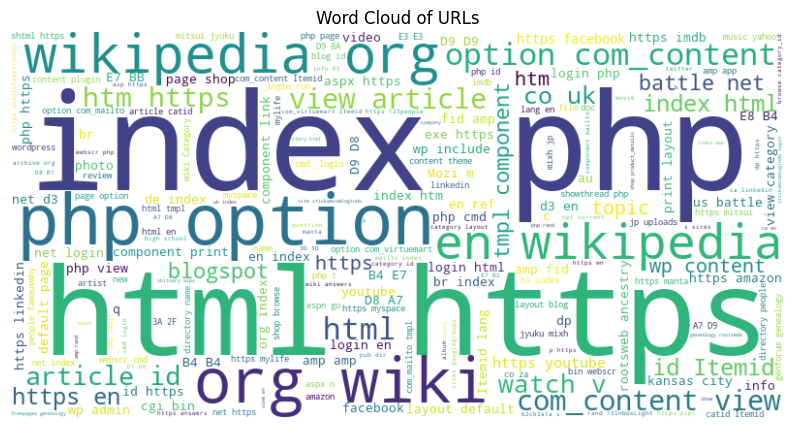

In [167]:
# Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(urls_data['url']))
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of URLs')
plt.show()

In [168]:
# Histogram
fig = make_subplots(rows=1, cols=1)

fig.add_trace(go.Histogram(x=urls_data['url_len'], nbinsx=100))

fig.update_layout(
    title='Distribution of URL Lengths',
    xaxis_title='URL Length',
    yaxis_title='Count',
    template='plotly_dark',
    font=dict(color='white')
)

fig.show()

In [169]:
# Bar chart for 'type' column
type_counts = urls_data['type'].value_counts()
fig = go.Figure(data=[go.Bar(x=type_counts.index, y=type_counts.values)])
fig.update_layout(title='Frequency of URL Types',
                  xaxis_title='URL Type',
                  yaxis_title='Count',
                  template='plotly_dark',
                  font=dict(color='white'),
                  showlegend=False)
fig.show()

In [170]:
# Pie chart for 'url_type' column
url_type_counts = urls_data['url_type'].value_counts()
fig = go.Figure(data=[go.Pie(labels=url_type_counts.index, values=url_type_counts.values)])
fig.update_layout(title='Distribution of URL Types',
                  template='plotly_dark',
                  font=dict(color='white'),
                  showlegend=True)
fig.show()

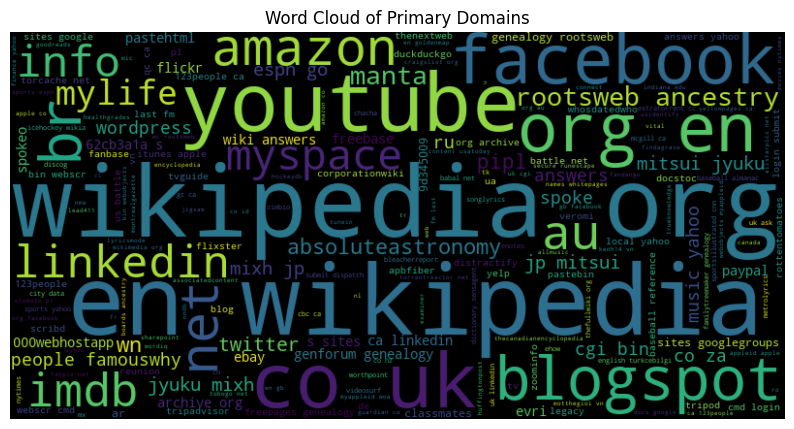

In [171]:
# Convert pri_domain values to strings and filter out None and int values
filtered_domains = urls_data['pri_domain'].map(str).dropna()

# Concatenate all pri_domain values into a single string
text = ' '.join(filtered_domains)

# Generate the WordCloud data
wordcloud = WordCloud(background_color='black', colormap='viridis', width=800, height=400).generate(text)

# Plot the WordCloud using matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Primary Domains', color='black')
plt.show()

In [172]:
# Create a DataFrame with the sum of each column
counts = urls_data[['letters_count', 'digits_count', 'special_chars_count']].sum()

# Create a bar chart for the counts of letters, digits, and special characters
fig = go.Figure(data=[
    go.Bar(name='Letters', x=['Count'], y=[counts['letters_count']]),
    go.Bar(name='Digits', x=['Count'], y=[counts['digits_count']]),
    go.Bar(name='Special Characters', x=['Count'], y=[counts['special_chars_count']])
])

fig.update_layout(title='Counts of Letters, Digits, and Special Characters',
                  xaxis_title='Type',
                  yaxis_title='Count',
                  barmode='group',
                  template='plotly_dark',
                  font=dict(color='white'))

fig.show()

In [174]:
import plotly.graph_objects as go

# Define the special color for True count
true_color = 'green'

# Define the special color for False count
false_color = 'red'

# Plot bar chart for the 'shortened' column
shortened_counts = urls_data['shortened'].value_counts()
colors = [true_color if val else false_color for val in shortened_counts.index]
fig_shortened = go.Figure(data=go.Bar(x=shortened_counts.index, y=shortened_counts, marker_color=colors))
fig_shortened.update_layout(title='Counts of shortened',
                            xaxis_title='Value',
                            yaxis_title='Count',
                            template='plotly_dark',
                            font=dict(color='white'))
fig_shortened.show()


# Plot bar chart for the 'secure_http' column
secure_http_counts = urls_data['secure_http'].value_counts()
colors = [true_color if val else false_color for val in secure_http_counts.index]
fig_secure_http = go.Figure(data=go.Bar(x=secure_http_counts.index, y=secure_http_counts, marker_color=colors))
fig_secure_http.update_layout(title='Counts of secure_http',
                              xaxis_title='Value',
                              yaxis_title='Count',
                              template='plotly_dark',
                              font=dict(color='white'))
fig_secure_http.show()

# Plot bar chart for the 'have_ip' column
have_ip_counts = urls_data['have_ip'].value_counts()
colors = [true_color if val else false_color for val in have_ip_counts.index]
fig_have_ip = go.Figure(data=go.Bar(x=have_ip_counts.index, y=have_ip_counts, marker_color=colors))
fig_have_ip.update_layout(title='Counts of have_ip',
                          xaxis_title='Value',
                          yaxis_title='Count',
                          template='plotly_dark',
                          font=dict(color='white'))
fig_have_ip.show()

In [175]:
# Select only the numeric columns from the DataFrame
numeric_data = urls_data.select_dtypes(include='number')

# Compute the correlation matrix
corr_matrix = numeric_data.corr()

# Create the heatmap trace
heatmap = go.Heatmap(
    z=corr_matrix.values,
    x=corr_matrix.columns,
    y=corr_matrix.columns,
    colorscale='Greys',  # Use a grayscale color scale
)

# Create the layout
layout = go.Layout(
    title='Correlation Heatmap (Numeric Values Only)',
    xaxis=dict(title='Variables'),
    yaxis=dict(title='Variables'),
    plot_bgcolor='black',  # Set the background color to black
    paper_bgcolor='black',  # Set the plot area background color to black
    font=dict(color='white')  # Set the font color to white
)

# Create the Figure object
fig = go.Figure(data=heatmap, layout=layout)

# Display the heatmap
fig.show()


In [176]:
urls_data.head()

,url,type,url_type,url_len,hostname_length,path_length,fd_length,tld,tld_length,pri_domain,...,special_chars_count,count-,count@,count?,count%,count.,count=,shortened,secure_http,have_ip
0,https://google.com,benign,0,18,10,0,0,com,3,google.com,...,4,0,0,0,0,1,0,0,1,0
1,https://youtube.com,benign,0,19,11,0,0,com,3,youtube.com,...,4,0,0,0,0,1,0,0,1,0
2,https://facebook.com,benign,0,20,12,0,0,com,3,facebook.com,...,4,0,0,0,0,1,0,0,1,0
3,https://baidu.com,benign,0,17,9,0,0,com,3,baidu.com,...,4,0,0,0,0,1,0,0,1,0
4,https://wikipedia.org,benign,0,21,13,0,0,org,3,wikipedia.org,...,4,0,0,0,0,1,0,0,1,0


In [177]:
def get_url_region(primary_domain):
    ccTLD_to_region = {
    ".ac": "Ascension Island",
    ".ad": "Andorra",
    ".ae": "United Arab Emirates",
    ".af": "Afghanistan",
    ".ag": "Antigua and Barbuda",
    ".ai": "Anguilla",
    ".al": "Albania",
    ".am": "Armenia",
    ".an": "Netherlands Antilles",
    ".ao": "Angola",
    ".aq": "Antarctica",
    ".ar": "Argentina",
    ".as": "American Samoa",
    ".at": "Austria",
    ".au": "Australia",
    ".aw": "Aruba",
    ".ax": "Åland Islands",
    ".az": "Azerbaijan",
    ".ba": "Bosnia and Herzegovina",
    ".bb": "Barbados",
    ".bd": "Bangladesh",
    ".be": "Belgium",
    ".bf": "Burkina Faso",
    ".bg": "Bulgaria",
    ".bh": "Bahrain",
    ".bi": "Burundi",
    ".bj": "Benin",
    ".bm": "Bermuda",
    ".bn": "Brunei Darussalam",
    ".bo": "Bolivia",
    ".br": "Brazil",
    ".bs": "Bahamas",
    ".bt": "Bhutan",
    ".bv": "Bouvet Island",
    ".bw": "Botswana",
    ".by": "Belarus",
    ".bz": "Belize",
    ".ca": "Canada",
    ".cc": "Cocos Islands",
    ".cd": "Democratic Republic of the Congo",
    ".cf": "Central African Republic",
    ".cg": "Republic of the Congo",
    ".ch": "Switzerland",
    ".ci": "Côte d'Ivoire",
    ".ck": "Cook Islands",
    ".cl": "Chile",
    ".cm": "Cameroon",
    ".cn": "China",
    ".co": "Colombia",
    ".cr": "Costa Rica",
    ".cu": "Cuba",
    ".cv": "Cape Verde",
    ".cw": "Curaçao",
    ".cx": "Christmas Island",
    ".cy": "Cyprus",
    ".cz": "Czech Republic",
    ".de": "Germany",
    ".dj": "Djibouti",
    ".dk": "Denmark",
    ".dm": "Dominica",
    ".do": "Dominican Republic",
    ".dz": "Algeria",
    ".ec": "Ecuador",
    ".ee": "Estonia",
    ".eg": "Egypt",
    ".er": "Eritrea",
    ".es": "Spain",
    ".et": "Ethiopia",
    ".eu": "European Union",
    ".fi": "Finland",
    ".fj": "Fiji",
    ".fk": "Falkland Islands",
    ".fm": "Federated States of Micronesia",
    ".fo": "Faroe Islands",
    ".fr": "France",
    ".ga": "Gabon",
    ".gb": "United Kingdom",
    ".gd": "Grenada",
    ".ge": "Georgia",
    ".gf": "French Guiana",
    ".gg": "Guernsey",
    ".gh": "Ghana",
    ".gi": "Gibraltar",
    ".gl": "Greenland",
    ".gm": "Gambia",
    ".gn": "Guinea",
    ".gp": "Guadeloupe",
    ".gq": "Equatorial Guinea",
    ".gr": "Greece",
    ".gs": "South Georgia and the South Sandwich Islands",
    ".gt": "Guatemala",
    ".gu": "Guam",
    ".gw": "Guinea-Bissau",
    ".gy": "Guyana",
    ".hk": "Hong Kong",
    ".hm": "Heard Island and McDonald Islands",
    ".hn": "Honduras",
    ".hr": "Croatia",
    ".ht": "Haiti",
    ".hu": "Hungary",
    ".id": "Indonesia",
    ".ie": "Ireland",
    ".il": "Israel",
    ".im": "Isle of Man",
    ".in": "India",
    ".io": "British Indian Ocean Territory",
    ".iq": "Iraq",
    ".ir": "Iran",
    ".is": "Iceland",
    ".it": "Italy",
    ".je": "Jersey",
    ".jm": "Jamaica",
    ".jo": "Jordan",
    ".jp": "Japan",
    ".ke": "Kenya",
    ".kg": "Kyrgyzstan",
    ".kh": "Cambodia",
    ".ki": "Kiribati",
    ".km": "Comoros",
    ".kn": "Saint Kitts and Nevis",
    ".kp": "Democratic People's Republic of Korea (North Korea)",
    ".kr": "Republic of Korea (South Korea)",
    ".kw": "Kuwait",
    ".ky": "Cayman Islands",
    ".kz": "Kazakhstan",
    ".la": "Laos",
    ".lb": "Lebanon",
    ".lc": "Saint Lucia",
    ".li": "Liechtenstein",
    ".lk": "Sri Lanka",
    ".lr": "Liberia",
    ".ls": "Lesotho",
    ".lt": "Lithuania",
    ".lu": "Luxembourg",
    ".lv": "Latvia",
    ".ly": "Libya",
    ".ma": "Morocco",
    ".mc": "Monaco",
    ".md": "Moldova",
    ".me": "Montenegro",
    ".mf": "Saint Martin (French part)",
    ".mg": "Madagascar",
    ".mh": "Marshall Islands",
    ".mk": "North Macedonia",
    ".ml": "Mali",
    ".mm": "Myanmar",
    ".mn": "Mongolia",
    ".mo": "Macao",
    ".mp": "Northern Mariana Islands",
    ".mq": "Martinique",
    ".mr": "Mauritania",
    ".ms": "Montserrat",
    ".mt": "Malta",
    ".mu": "Mauritius",
    ".mv": "Maldives",
    ".mw": "Malawi",
    ".mx": "Mexico",
    ".my": "Malaysia",
    ".mz": "Mozambique",
    ".na": "Namibia",
    ".nc": "New Caledonia",
    ".ne": "Niger",
    ".nf": "Norfolk Island",
    ".ng": "Nigeria",
    ".ni": "Nicaragua",
    ".nl": "Netherlands",
    ".no": "Norway",
    ".np": "Nepal",
    ".nr": "Nauru",
    ".nu": "Niue",
    ".nz": "New Zealand",
    ".om": "Oman",
    ".pa": "Panama",
    ".pe": "Peru",
    ".pf": "French Polynesia",
    ".pg": "Papua New Guinea",
    ".ph": "Philippines",
    ".pk": "Pakistan",
    ".pl": "Poland",
    ".pm": "Saint Pierre and Miquelon",
    ".pn": "Pitcairn",
    ".pr": "Puerto Rico",
    ".ps": "Palestinian Territory",
    ".pt": "Portugal",
    ".pw": "Palau",
    ".py": "Paraguay",
    ".qa": "Qatar",
    ".re": "Réunion",
    ".ro": "Romania",
    ".rs": "Serbia",
    ".ru": "Russia",
    ".rw": "Rwanda",
    ".sa": "Saudi Arabia",
    ".sb": "Solomon Islands",
    ".sc": "Seychelles",
    ".sd": "Sudan",
    ".se": "Sweden",
    ".sg": "Singapore",
    ".sh": "Saint Helena",
    ".si": "Slovenia",
    ".sj": "Svalbard and Jan Mayen",
    ".sk": "Slovakia",
    ".sl": "Sierra Leone",
    ".sm": "San Marino",
    ".sn": "Senegal",
    ".so": "Somalia",
    ".sr": "Suriname",
    ".ss": "South Sudan",
    ".st": "São Tomé and Príncipe",
    ".sv": "El Salvador",
    ".sx": "Sint Maarten (Dutch part)",
    ".sy": "Syria",
    ".sz": "Eswatini",
    ".tc": "Turks and Caicos Islands",
    ".td": "Chad",
    ".tf": "French Southern Territories",
    ".tg": "Togo",
    ".th": "Thailand",
    ".tj": "Tajikistan",
    ".tk": "Tokelau",
    ".tl": "Timor-Leste",
    ".tm": "Turkmenistan",
    ".tn": "Tunisia",
    ".to": "Tonga",
    ".tr": "Turkey",
    ".tt": "Trinidad and Tobago",
    ".tv": "Tuvalu",
    ".tw": "Taiwan",
    ".tz": "Tanzania",
    ".ua": "Ukraine",
    ".ug": "Uganda",
    ".uk": "United Kingdom",
    ".us": "United States",
    ".uy": "Uruguay",
    ".uz": "Uzbekistan",
    ".va": "Vatican City",
    ".vc": "Saint Vincent and the Grenadines",
    ".ve": "Venezuela",
    ".vg": "British Virgin Islands",
    ".vi": "U.S. Virgin Islands",
    ".vn": "Vietnam",
    ".vu": "Vanuatu",
    ".wf": "Wallis and Futuna",
    ".ws": "Samoa",
    ".ye": "Yemen",
    ".yt": "Mayotte",
    ".za": "South Africa",
    ".zm": "Zambia",
    ".zw": "Zimbabwe"
    }
    
    for ccTLD in ccTLD_to_region:
        if primary_domain.endswith(ccTLD):
            return ccTLD_to_region[ccTLD]
    
    return "Global"

In [178]:
urls_data['url_region'] = urls_data['pri_domain'].apply(lambda x: get_url_region(str(x)))

In [179]:
urls_data.head()

,url,type,url_type,url_len,hostname_length,path_length,fd_length,tld,tld_length,pri_domain,...,count-,count@,count?,count%,count.,count=,shortened,secure_http,have_ip,url_region
0,https://google.com,benign,0,18,10,0,0,com,3,google.com,...,0,0,0,0,1,0,0,1,0,Global
1,https://youtube.com,benign,0,19,11,0,0,com,3,youtube.com,...,0,0,0,0,1,0,0,1,0,Global
2,https://facebook.com,benign,0,20,12,0,0,com,3,facebook.com,...,0,0,0,0,1,0,0,1,0,Global
3,https://baidu.com,benign,0,17,9,0,0,com,3,baidu.com,...,0,0,0,0,1,0,0,1,0,Global
4,https://wikipedia.org,benign,0,21,13,0,0,org,3,wikipedia.org,...,0,0,0,0,1,0,0,1,0,Global


In [181]:
# Count the occurrences of each region
region_counts = urls_data['url_region'].value_counts()

# Add a count for 'Global' if it doesn't exist in the DataFrame
if 'Global' not in region_counts.index:
    region_counts['Global'] = 0

# Create a dataframe for the region counts
data = pd.DataFrame({'region': region_counts.index, 'count': region_counts.values})

# Define the colorscale for the choropleth
colorscale = 'YlOrRd'  # Change the colorscale to 'YlOrRd' for a more vibrant color scheme

# Create the Choropleth chart
fig = go.Figure(data=go.Choropleth(
    locations=data['region'],
    z=data['count'],
    locationmode='country names',
    colorscale=colorscale,
    autocolorscale=True,  # Set autocolorscale to True for vibrant colors
    marker_line_color='white',
    colorbar_title='Count'
))

# Set the chart title
fig.update_layout(title_text='Distribution of URL Regions')

# Display the chart
fig.show()

In [182]:
def extract_root_domain(url):
    extracted = tldextract.extract(url)
    root_domain = extracted.domain
    return root_domain

In [183]:
urls_data['root_domain'] = urls_data['pri_domain'].apply(lambda x: extract_root_domain(str(x)))

In [184]:
urls_data.head()

,url,type,url_type,url_len,hostname_length,path_length,fd_length,tld,tld_length,pri_domain,...,count@,count?,count%,count.,count=,shortened,secure_http,have_ip,url_region,root_domain
0,https://google.com,benign,0,18,10,0,0,com,3,google.com,...,0,0,0,1,0,0,1,0,Global,google
1,https://youtube.com,benign,0,19,11,0,0,com,3,youtube.com,...,0,0,0,1,0,0,1,0,Global,youtube
2,https://facebook.com,benign,0,20,12,0,0,com,3,facebook.com,...,0,0,0,1,0,0,1,0,Global,facebook
3,https://baidu.com,benign,0,17,9,0,0,com,3,baidu.com,...,0,0,0,1,0,0,1,0,Global,baidu
4,https://wikipedia.org,benign,0,21,13,0,0,org,3,wikipedia.org,...,0,0,0,1,0,0,1,0,Global,wikipedia


In [185]:
urls_data.isnull().sum()

url                    0
type                   0
url_type               0
url_len                0
hostname_length        0
path_length            0
fd_length              0
tld                    0
tld_length             0
pri_domain             0
letters_count          0
digits_count           0
special_chars_count    0
count-                 0
count@                 0
count?                 0
count%                 0
count.                 0
count=                 0
shortened              0
secure_http            0
have_ip                0
url_region             0
root_domain            0
dtype: int64

In [186]:
urls_data.shape

(1048575, 24)

In [187]:
urls_data.duplicated().sum()

18512

In [188]:
urls_data.drop_duplicates(inplace=True)

In [189]:
urls_data.columns

Index(['url', 'type', 'url_type', 'url_len', 'hostname_length', 'path_length',
       'fd_length', 'tld', 'tld_length', 'pri_domain', 'letters_count',
       'digits_count', 'special_chars_count', 'count-', 'count@', 'count?',
       'count%', 'count.', 'count=', 'shortened', 'secure_http', 'have_ip',
       'url_region', 'root_domain'],
      dtype='object')

In [190]:
urls_data.head()

,url,type,url_type,url_len,hostname_length,path_length,fd_length,tld,tld_length,pri_domain,...,count@,count?,count%,count.,count=,shortened,secure_http,have_ip,url_region,root_domain
0,https://google.com,benign,0,18,10,0,0,com,3,google.com,...,0,0,0,1,0,0,1,0,Global,google
1,https://youtube.com,benign,0,19,11,0,0,com,3,youtube.com,...,0,0,0,1,0,0,1,0,Global,youtube
2,https://facebook.com,benign,0,20,12,0,0,com,3,facebook.com,...,0,0,0,1,0,0,1,0,Global,facebook
3,https://baidu.com,benign,0,17,9,0,0,com,3,baidu.com,...,0,0,0,1,0,0,1,0,Global,baidu
4,https://wikipedia.org,benign,0,21,13,0,0,org,3,wikipedia.org,...,0,0,0,1,0,0,1,0,Global,wikipedia


In [191]:
urls_data.to_csv('MaliciousURLsProcessed.csv', index=False)

In [192]:
data = urls_data.drop(columns=['url','type','pri_domain','tld'])
data.head()

,url_type,url_len,hostname_length,path_length,fd_length,tld_length,letters_count,digits_count,special_chars_count,count-,count@,count?,count%,count.,count=,shortened,secure_http,have_ip,url_region,root_domain
0,0,18,10,0,0,3,14,0,4,0,0,0,0,1,0,0,1,0,Global,google
1,0,19,11,0,0,3,15,0,4,0,0,0,0,1,0,0,1,0,Global,youtube
2,0,20,12,0,0,3,16,0,4,0,0,0,0,1,0,0,1,0,Global,facebook
3,0,17,9,0,0,3,13,0,4,0,0,0,0,1,0,0,1,0,Global,baidu
4,0,21,13,0,0,3,17,0,4,0,0,0,0,1,0,0,1,0,Global,wikipedia


In [193]:
data['root_domain'].value_counts()

wikipedia                25771
youtube                  17260
0                        16928
facebook                 16630
blogspot                 15692
                         ...  
pridewines                   1
webelapp                     1
agrimetiersmartinique        1
pedalshop                    1
chrisal                      1
Name: root_domain, Length: 172858, dtype: int64

In [194]:
data = data[data['root_domain'] != '0']

In [195]:
data['root_domain'].value_counts()

wikipedia                25771
youtube                  17260
facebook                 16630
blogspot                 15692
amazon                   10407
                         ...  
pridewines                   1
webelapp                     1
agrimetiersmartinique        1
pedalshop                    1
chrisal                      1
Name: root_domain, Length: 172857, dtype: int64

In [196]:
len(data['root_domain'].value_counts())

172857

In [197]:
def hash_encode(category):
    hash_object = hashlib.md5(category.encode())
    return int(hash_object.hexdigest(), 16) % (10 ** 8)

In [198]:
# Apply hash encoding to the categorical feature
data['root_domain'] = data['root_domain'].apply(hash_encode)

In [199]:
# Apply hash encoding to the categorical feature
data['url_region'] = data['url_region'].apply(hash_encode)

In [200]:
data.head()

,url_type,url_len,hostname_length,path_length,fd_length,tld_length,letters_count,digits_count,special_chars_count,count-,count@,count?,count%,count.,count=,shortened,secure_http,have_ip,url_region,root_domain
0,0,18,10,0,0,3,14,0,4,0,0,0,0,1,0,0,1,0,32604616,83981562
1,0,19,11,0,0,3,15,0,4,0,0,0,0,1,0,0,1,0,32604616,70606721
2,0,20,12,0,0,3,16,0,4,0,0,0,0,1,0,0,1,0,32604616,61727577
3,0,17,9,0,0,3,13,0,4,0,0,0,0,1,0,0,1,0,32604616,38259078
4,0,21,13,0,0,3,17,0,4,0,0,0,0,1,0,0,1,0,32604616,41540124


In [201]:
data.shape

(1013135, 20)

In [202]:
data.isnull().sum()

url_type               0
url_len                0
hostname_length        0
path_length            0
fd_length              0
tld_length             0
letters_count          0
digits_count           0
special_chars_count    0
count-                 0
count@                 0
count?                 0
count%                 0
count.                 0
count=                 0
shortened              0
secure_http            0
have_ip                0
url_region             0
root_domain            0
dtype: int64

In [203]:
data.to_csv('MaliciousURLsTransformed.csv', index=False)

In [204]:
x = data.drop(columns=['url_type'])
y = data['url_type'] 
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3, random_state=42)

In [205]:
print(f"X_train Shape : {x_train.shape}")
print(f"Y_train Shape : {y_train.shape}")
print(f"X_test  Shape : {x_test.shape}")
print(f"Y_test  Shape : {y_test.shape}")

X_train Shape : (709194, 19)
Y_train Shape : (709194,)
X_test  Shape : (303941, 19)
Y_test  Shape : (303941,)


#############################################
######-Model => DecisionTreeClassifier 
Test Accuracy:  98.85%  
              Classification Report 
              precision    recall  f1-score   support

           0       0.99      0.99      0.99    230584
           1       0.98      0.98      0.98     73357

    accuracy                           0.99    303941
   macro avg       0.98      0.98      0.98    303941
weighted avg       0.99      0.99      0.99    303941

             Confusion Matrix 


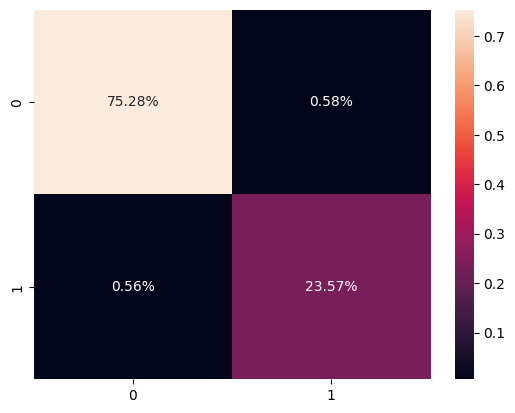

###################- End -###################
#############################################
######-Model => RandomForestClassifier 


In [206]:
models = [
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    AdaBoostClassifier(),
    KNeighborsClassifier(),
    ExtraTreesClassifier(),
    GaussianNB(),
    MultinomialNB(),
    LogisticRegression(), 
    SGDClassifier()
]

results = []

for model in models:
    print('#############################################')
    print('######-Model =>\033[07m {} \033[0m'.format(type(model).__name__))
    
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, output_dict=True)
    f1_score = report['macro avg']['f1-score']
    precision = report['macro avg']['precision']
    recall = report['macro avg']['recall']
    
    results.append({
        'Model': type(model).__name__,
        'Accuracy': accuracy,
        'F1-Score': f1_score,
        'Precision': precision,
        'Recall': recall
    })
    
    print('Test Accuracy:\033[32m \033[01m {:.2f}% \033[30m \033[0m'.format(accuracy * 100))
    print('\033[01m              Classification Report \033[0m')
    print(classification_report(y_test, y_pred))
    print('\033[01m             Confusion Matrix \033[0m')
    cf_matrix = confusion_matrix(y_test, y_pred)
    plot_ = sns.heatmap(cf_matrix / np.sum(cf_matrix), annot=True, fmt='0.2%')
    plt.show()
    print('\033[31m###################- End -###################\033[0m')

In [ ]:
models_report = pd.DataFrame(results)
models_report.head()

,Model,Accuracy,F1-Score,Precision,Recall
0,DecisionTreeClassifier,0.895979,0.833060,0.832080,0.834121
1,RandomForestClassifier,0.896913,0.834631,0.857722,0.816380
2,AdaBoostClassifier,0.428405,0.449648,0.526934,0.545675
3,KNeighborsClassifier,0.882134,0.829504,0.862916,0.806042
4,ExtraTreesClassifier,0.896616,0.837549,0.858852,0.820395


In [ ]:
import plotly.graph_objects as go

# Create the Plotly figure
fig = go.Figure(data=go.Table(
    header=dict(values=['Model', 'Accuracy', 'Precision', 'Recall', 'F1-Score'],
                fill_color='black',
                font=dict(color='white'),
                align='center'),
    cells=dict(values=[models_report['Model'], models_report['Accuracy'], models_report['Precision'],
                       models_report['Recall'], models_report['F1-Score']],
               fill_color='black',
               font=dict(color='white'),
               align='center')))

# Update layout for dark background and white font
fig.update_layout(
    paper_bgcolor='black',
    plot_bgcolor='black',
    font=dict(color='white'))

# Display the plot
fig.show()

In [ ]:
import plotly.graph_objects as go

# Iterate over the columns of models_report DataFrame
for column in models_report.columns:
    # Create a Plotly figure for each column
    fig = go.Figure(data=go.Bar(
        x=models_report['Model'],
        y=models_report[column],
        marker=dict(color='steelblue'),
        text=models_report[column],
        textposition='auto'
    ))

    # Set the chart title and axis labels
    fig.update_layout(
        title_text=column,
        xaxis_title='Model',
        yaxis_title=column,
        plot_bgcolor='rgb(17,17,17)',  # Dark background color
        paper_bgcolor='rgb(17,17,17)',  # Dark background color
        font=dict(color='white')  # White font color
    )

    # Display the chart
    fig.show()
